# Image Processing

## What topics will be discussed in this section?
* Image processing operations.
* Performing operations such as smoothing, blurring, and morphological operations.
* Grab properties such as color spaces and histograms.

# What is Color Mapping?
* So far we know about RGB coding.
* Because RGB coding is kind of old, HSL (hue, saturation, lightness) and HSV (hue, saturation, value) were developed as alternatives to RGB in the 70's.
* HSL and HSV are closely aligned with the way human vision perceives color.
* It's a good thing to know how to convert RGB to HSL & HSV.
* We can change colorspaces using **cvtColor**.

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

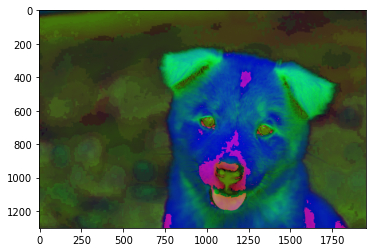

In [ ]:
img = cv.imread('00-puppy.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
plt.imshow(img)

# Blending and Pasting images with OpenCV
* We will be often see working with multiple images.
* OpenCV has many methods of blending and pasting images on top of each other.
* Blending images is do through the use of the **addWeighted** function.

In [ ]:
img1 = cv.imread('dog_backpack.jpg')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.imread('watermark_no_copy.png')
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

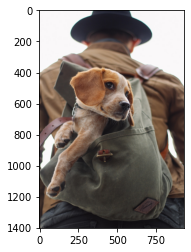

In [ ]:
plt.imshow(img1)

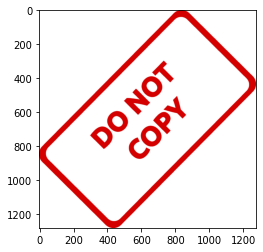

In [ ]:
plt.imshow(img2)

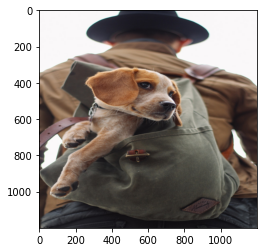

In [ ]:
# We can clearly see that both of the these images don't 
# share the same size so we need to take this in consideration when blending them together.
# So let's resize them.
img1 = cv.resize(img1, (1200, 1200))
img2 = cv.resize(img2, (1200, 1200))
# So here we can see the difference.
plt.imshow(img1)

## cv.addWeighted(src1, alpha, src2, beta, gamma)
The formula for blending an image is:
```
blending_formula = beta * src1 + beta * src2 + gamma
```
* Alpha and Beta can adjust the weight of how an image is displayed.

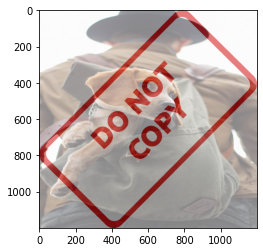

In [ ]:
blended_img = cv.addWeighted(src1=img1, alpha=0.5, src2=img2, beta=0.5, gamma=0)
plt.imshow(blended_img)

## Pasting images
Here are the steps needed to paste an image:
1. First assign which is the large and small images.
2. Set the origin and ending points.
3. Reassign the values of the large image.
4. Display the image

In [ ]:
img2 = cv.resize(img2, (600, 600))
img1 = cv.imread('dog_backpack.jpg')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)

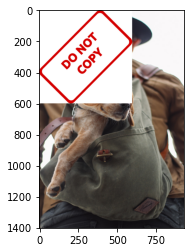

In [ ]:
# Now let's review how we can paste a photo over another:
large_img = img1
small_img = img2
# Set the origin coordinates:
x_offset = 0
y_offset = 0
# Set the stopping point coordinates:
x_end = x_offset + small_img.shape[1]
y_end = y_offset + small_img.shape[0]
# Reassign the values of the large image:
large_img[y_offset:y_end, x_offset:x_end] = small_img
# Now let's see the image:
plt.imshow(large_img)

## Pasting images with OpenCV - Masks
* A mask is only going to let certain parts of an image filter through when we paste it into another image.

In [ ]:
img1 = cv.imread('dog_backpack.jpg')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.imread('watermark_no_copy.png')
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
img2 = cv.resize(img2, (600, 600))
img1.shape

(1401, 934, 3)

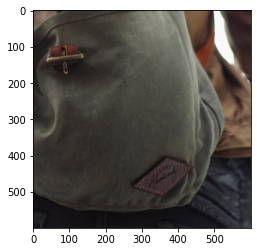

In [ ]:
# To achieve this we first must create a region of interest where we want to paste our image i.e. a 600x600 cube.
x_offset = 934 - 600
y_offset = 1401 - 600
# Now let's set the region of interest.
roi = img1[y_offset:1401, x_offset:943]
plt.imshow(roi)

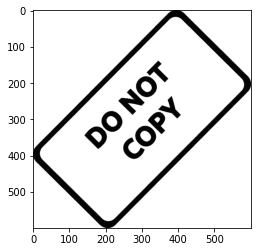

In [ ]:
# Now let's make the second image grayscaled.
img2_gray = cv.cvtColor(img2, cv.COLOR_RGB2GRAY)
plt.imshow(img2_gray, cmap='gray')

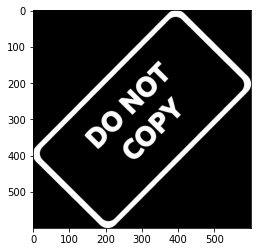

In [ ]:
# Let's inverse the colors of the image.
mask_inv = cv.bitwise_not(img2_gray)
plt.imshow(mask_inv, cmap='gray')

In [ ]:
mask_inv.shape

(600, 600)

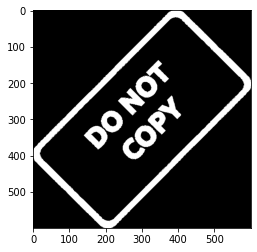

In [ ]:
# As we see there is not third color channel.
# Let's reassign the third color channel now.
white_background = np.full(img2.shape, 255, dtype=np.uint8)
# Now let's create the background for the inverse mask.
bk = cv.bitwise_or(white_background, white_background, mask=mask_inv)
# Let's visualize this image
plt.imshow(bk)

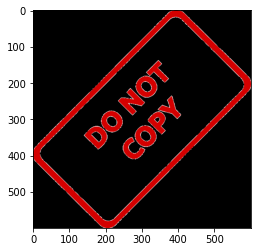

In [ ]:
# Now let's reassign the original image with the mask on.
fg = cv.bitwise_or(img2, img2, mask=mask_inv)
# Lets visualize the original image.
plt.imshow(fg)

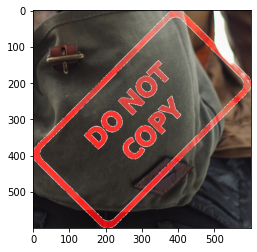

In [ ]:
# Now this is how the final region of interest looks like:
final_roi = cv.bitwise_or(roi, fg)
plt.imshow(final_roi)

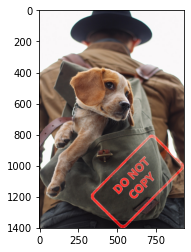

In [ ]:
large_img = img1
small_img = final_roi
large_img[y_offset:y_offset+small_img.shape[0], x_offset:x_offset+small_img.shape[1]] = small_img
plt.imshow(large_img)

# Image Thresholding
* In some cases it is necessary to convert color images to grayscale, since only edges and shapes end up being important.
* Thresholding will convert an image to consist of only two values, white or black.

Example:

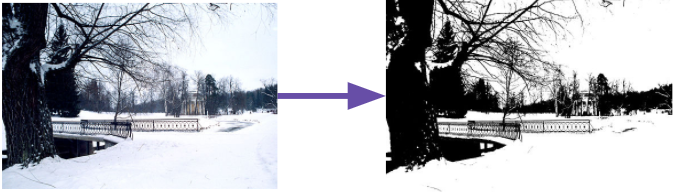

In [ ]:
  import numpy as np
  import matplotlib.pyplot as plt
  import cv2 as cv

In [ ]:
def show_pic(img):
  fig = plt.figure(figsize=(15, 15))
  ax = fig.add_subplot(111)
  ax.imshow(img, cmap='gray')

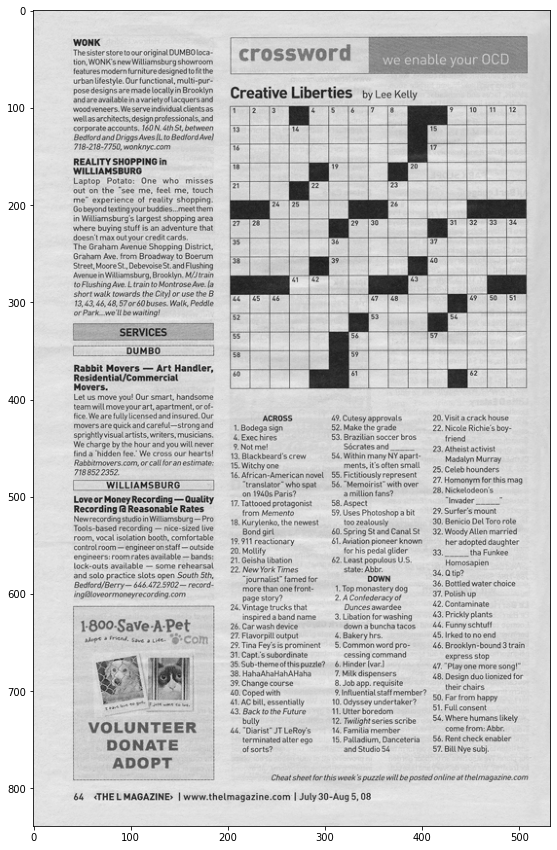

In [ ]:
img = cv.imread('crossword.jpg', 0)
show_pic(img)

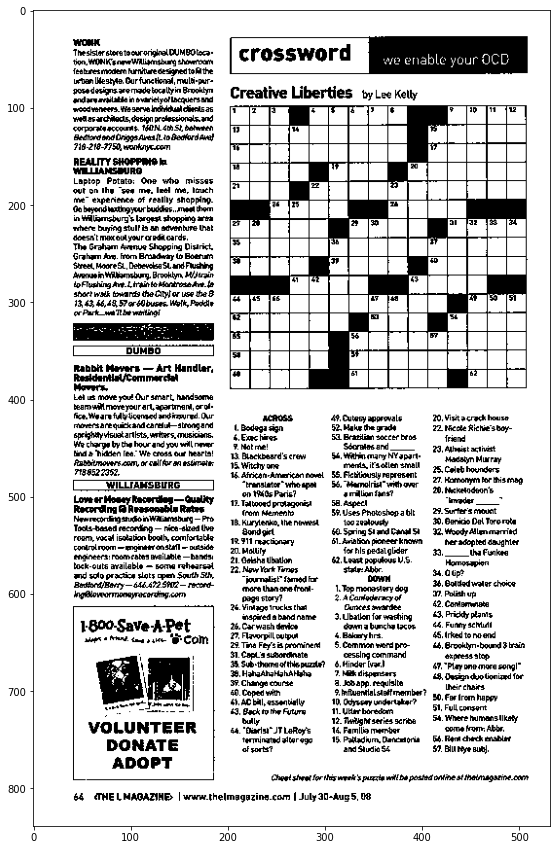

In [ ]:
# The basic script for image thresholding could be the following...
# cv.threshold(src, thresh_value, maxvalue, type_of_threshold)
ret, thresh1 = cv.threshold(img, 180, 255, cv.THRESH_BINARY)
show_pic(thresh1)

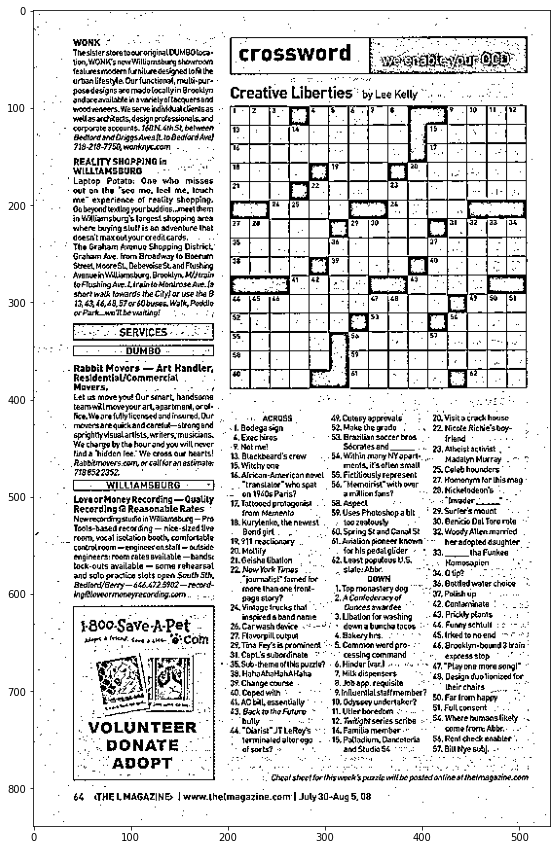

In [ ]:
# This is another method of image thresholding...
# cv.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize)
thresh2 = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 8)
show_pic(thresh2)

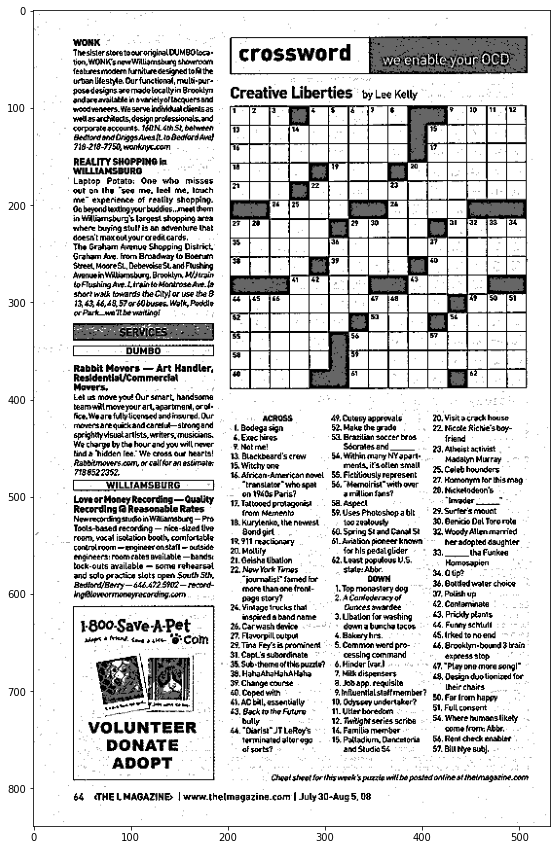

In [ ]:
blended = cv.addWeighted(src1=thresh1, alpha=0.6, src2=thresh2, beta=0.4, gamma=0)
show_pic(blended)

# Blurring and Smoothing
* Smoothing an image can help get rid of noise.
* We can detect the edges of an image by blurring it and then smoothing it as shown in the following image:

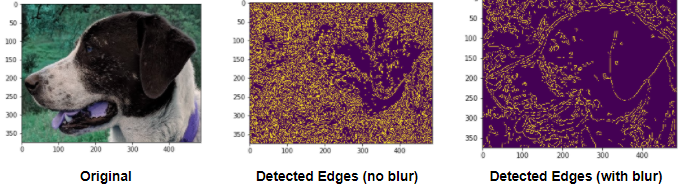

The methods we will review in this section will be:
* Gamma Correction: Make an image brigther or darker depending on the gamma value.
* Kernel Based Filters: To produce of variety of effects.

In [ ]:
def load_img():
  img = cv.imread('bricks.jpg').astype(np.float32) / 255
  img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  return img

In [ ]:
def display_img(img):
  fig = plt.figure(figsize=(12, 10))
  ax = fig.add_subplot(111)
  ax.imshow(img)

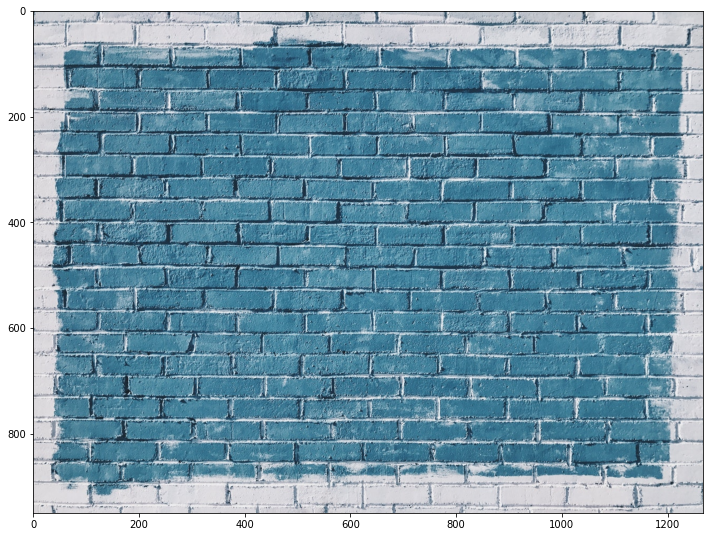

In [ ]:
i = load_img()
display_img(i)

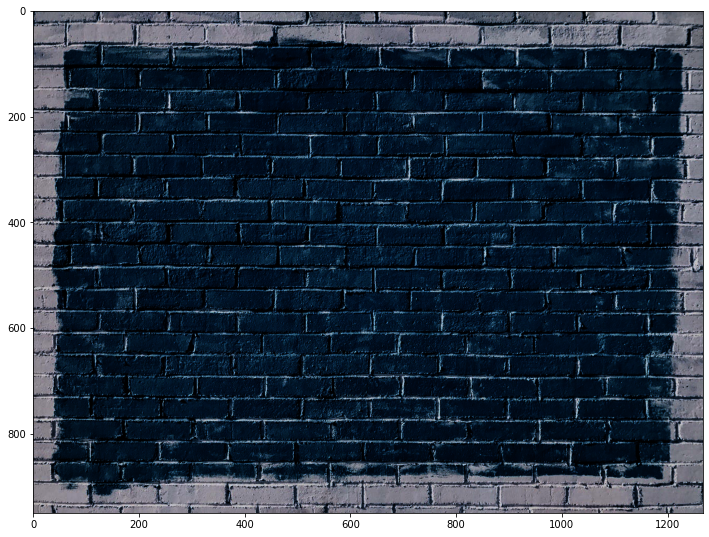

In [ ]:
# When gamma gets lower it turn lighter but when gamma is heigher it turns darker.
gamma = 4
result = np.power(i, gamma)
display_img(result)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


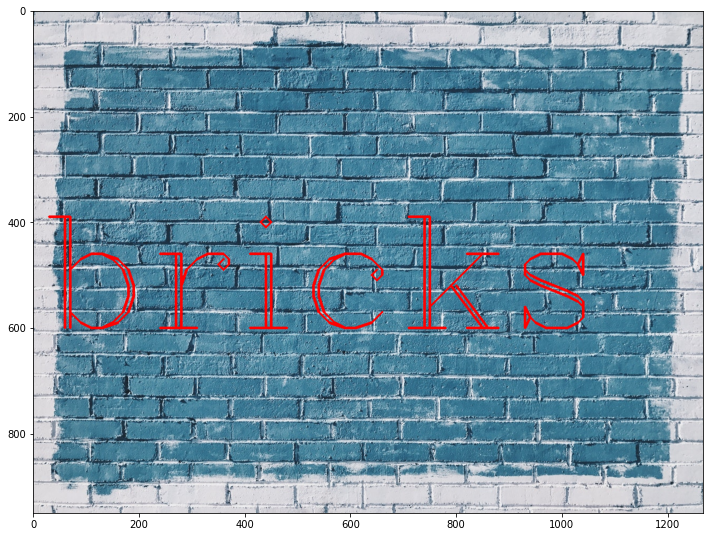

In [ ]:
# Now let's try to blur some pictures
img = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(img, text='bricks', org=(10, 600), fontFace=font, fontScale=10, color=(255, 0, 0), thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


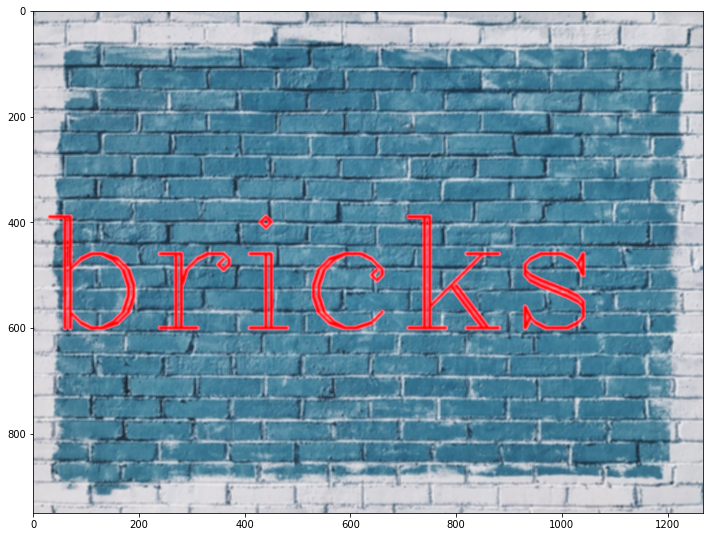

In [ ]:
# To blur an image we need to take advantage of OpenCV's blur function.
# cv.blur(img, kernel_size)
blurred = cv.blur(img, ksize=(5, 5))
display_img(blurred)

In [ ]:
img = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(img, text='bricks', org=(10, 600), fontFace=font, fontScale=10, color=(255, 0, 0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


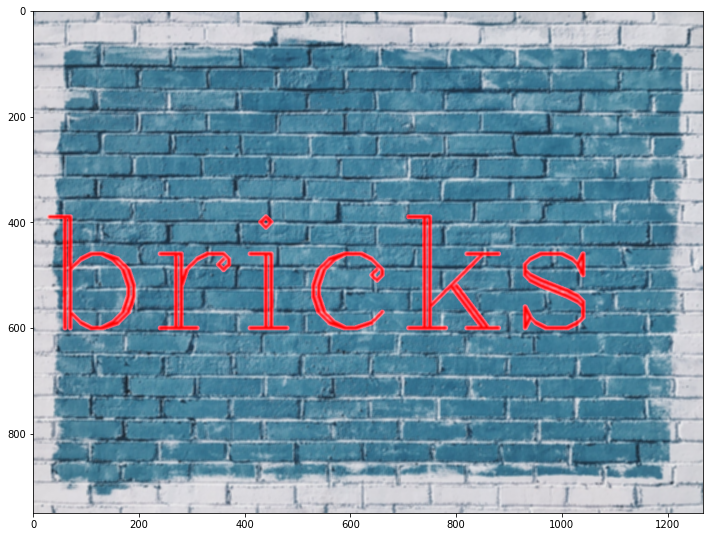

In [ ]:
# We can also blur images using the GaussianBlur function.
# cv.GaussianBlur(source, kernel_size, sigmaX)
gaussian_blur = cv.GaussianBlur(src=img, ksize=(5, 5), sigmaX=10)
display_img(gaussian_blur)

In [ ]:
img = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(img, text='bricks', org=(10, 600), fontFace=font, fontScale=10, color=(255, 0, 0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


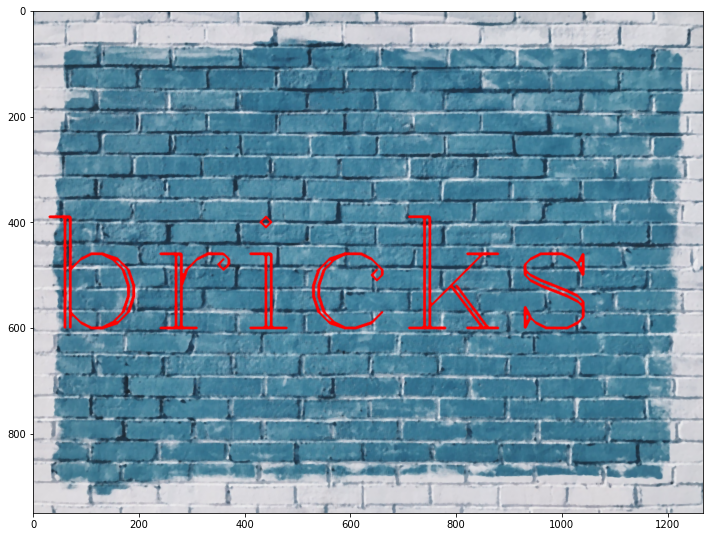

In [ ]:
# An alternative to the default blur function and the GaussianBlur function will be the medianBlur function.
median_blur = cv.medianBlur(src=img, ksize=5)
display_img(median_blur)

# Morphological Operators
* Morphological Operators are sets of kernels that can achieve a variety of effects such as reducing noise.
* Some operators are good at reducing black points on a white background and vice versa.
* Some operators can also achieve an erosion and dilation effect that can add or erode an existing image.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [ ]:
def load_img():
  blank_img = np.zeros((600, 600))
  font = cv.FONT_HERSHEY_SIMPLEX
  cv.putText(blank_img, text='ABCDE', org=(50, 300), fontFace=font, fontScale=5, color=(255, 255, 255), thickness=25)
  return blank_img

In [ ]:
def display_img(img):
  fig = plt.figure(figsize=(12, 10))
  ax = fig.add_subplot(111)
  ax.imshow(img, cmap='gray')

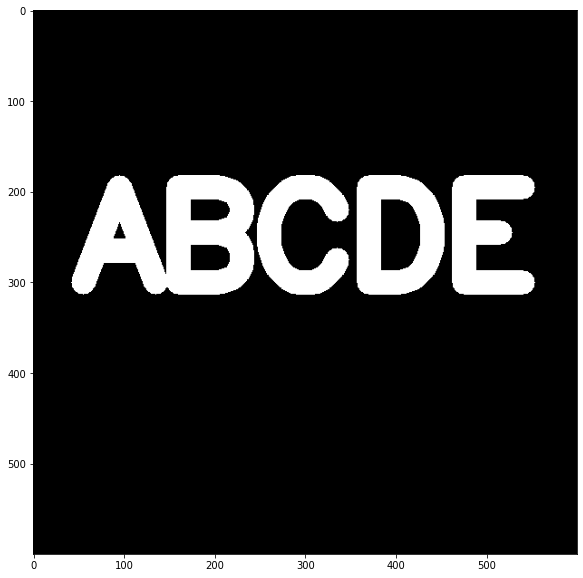

In [ ]:
img = load_img()
display_img(img)

## cv.erode(src, kernel, iterations)
* src: We need to provide an image to work with.
* kernel: We must provide a kernel size.
* iterations: How many times do we want this function to repeat itself?

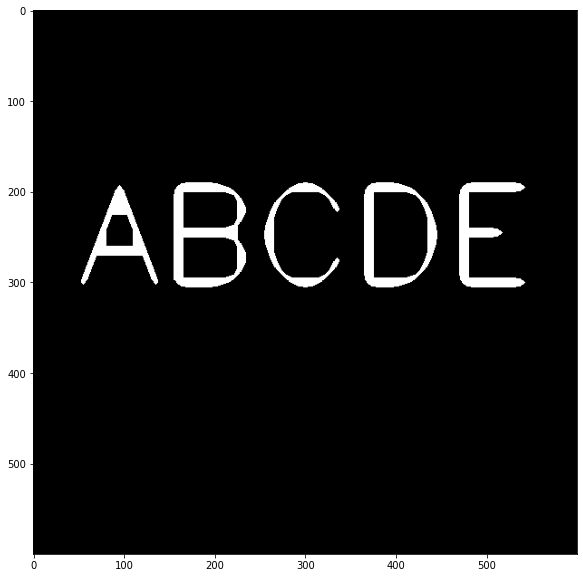

In [ ]:
# Let's try to erode an existing image with the erode function from OpenCV.
# First let's set the kernel.
kernel = np.ones((5, 5), dtype=np.uint8)
result = cv.erode(src=img, kernel=kernel, iterations=4)
display_img(result)
# We will see that the letters start to fade.

## cv.morphologyEx(src, type, kernel)
* src: Provide an image to work with.
* type: What type of algorithm to apply.
* kernel: Provide the kernel size.

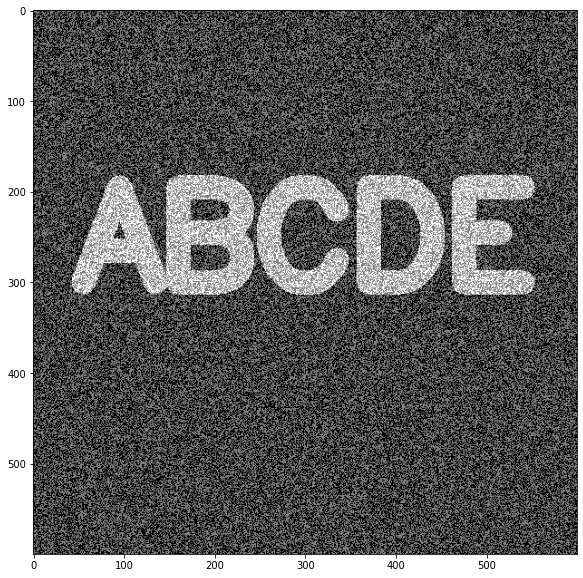

In [ ]:
black_noise = np.random.randint(low=0, high=2, size=(600, 600))
black_noise = black_noise * -255
black_noise_img = img + black_noise
display_img(black_noise_img)

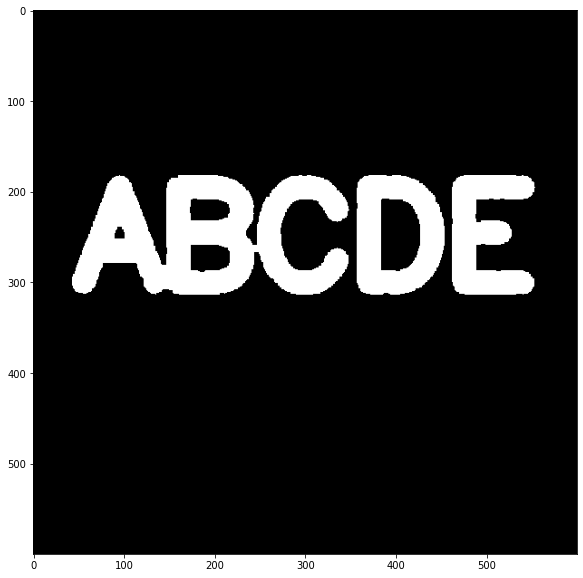

In [ ]:
# Let's fix that image previously shown.
closing = cv.morphologyEx(black_noise_img, cv.MORPH_CLOSE, kernel)
display_img(closing)
# The following image is a perfect example of how OpenCV can fix images.

# Gradients
* An image gradient is a directional change in the color of an image.
* In this section we will review Sobel-Feldman Operators.

Here is an example of the Sobel operator:

**Original Image**

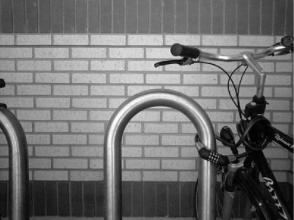

**Normalized X-gradient from Sobel operator**

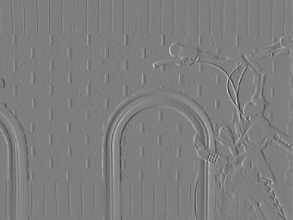

**Normalized Y-gradient from Sobel operator**

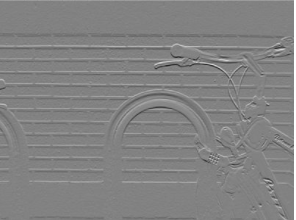

* The **Laplacian Operator** will return both x and y normalized gradients.

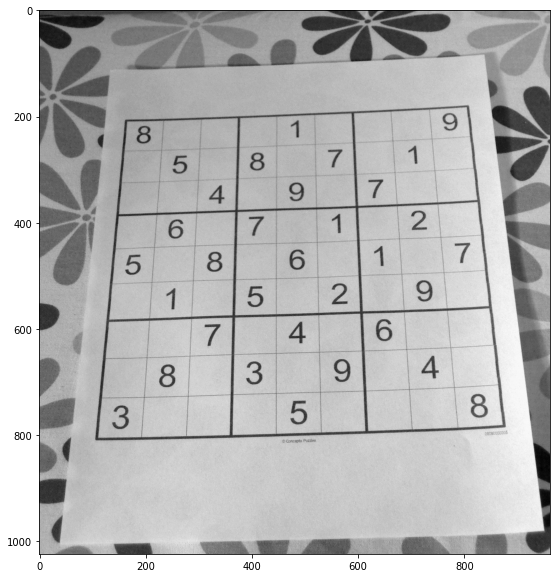

In [ ]:
img = cv.imread('sudoku.jpg', 0)
display_img(img)

## cv.Sobel(src, ddepth, dx, dy)
* src: Provide an image to analyze.
* ddepth: Precision of each pixel.
* dx: Derivative of the x direction, 1 equals we want the X-gradient.
* dy: Derivative of the y direction.
* ksize: Kernel size.

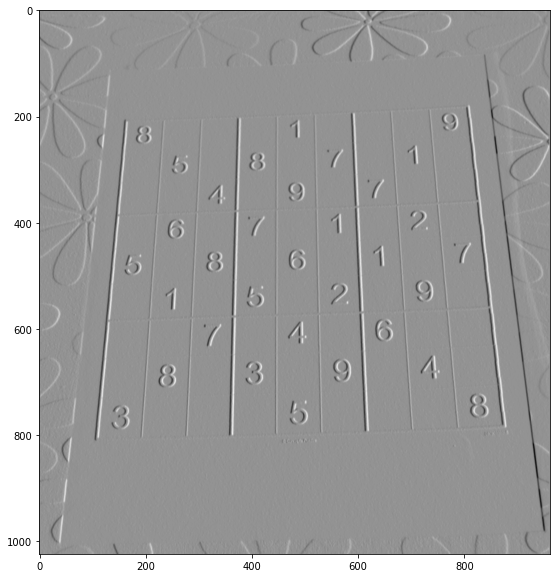

In [ ]:
# Let's proceed on calculating the X-Gradient Sobel operator
sobelx = cv.Sobel(src=img, ddepth=cv.CV_64F, dx=1, dy=0, ksize=5)
display_img(sobelx)

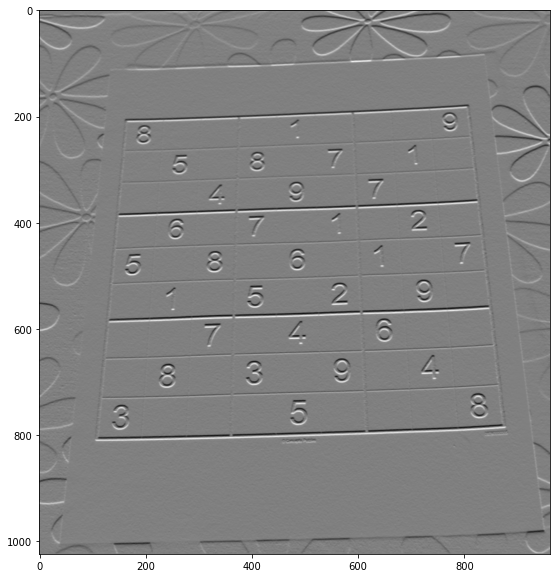

In [ ]:
# Now let's calculate the Y-Gradient Sobel operator
sobely = cv.Sobel(src=img, ddepth=cv.CV_64F, dx=0, dy=1, ksize=5)
display_img(sobely)

## cv.Laplacian(src, ddepth)
* src: Provide an image to work with.
* ddepth: Precision of each pixel.
* dx & dy: We don't need to specify neither of those.

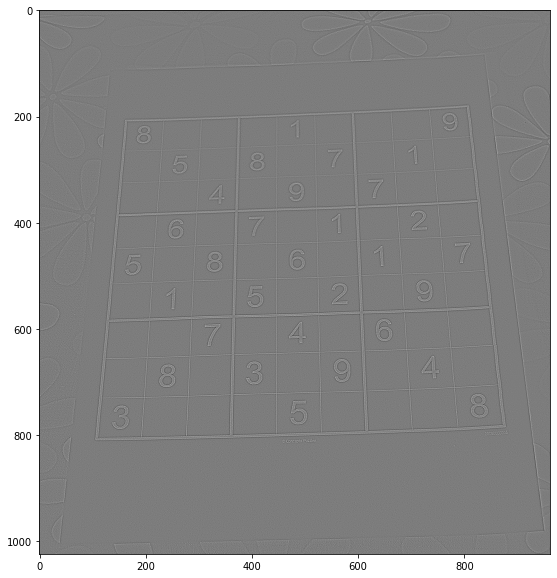

In [ ]:
laplacian = cv.Laplacian(src=img, ddepth=cv.CV_64F)
display_img(laplacian)

# Histogram
* A normal histogram is a visual representation of a timeline.
* A histogram for images, displays the frequency of values of colors in RGB scale. The values range from 0-255

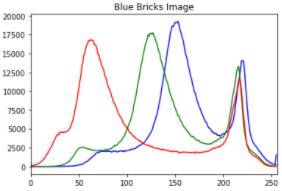

In [ ]:
dark_horse = cv.imread('horse.jpg')
show_horse = cv.cvtColor(dark_horse, cv.COLOR_BGR2RGB)

rainbow = cv.imread('rainbow.jpg')
show_rainbow = cv.cvtColor(rainbow, cv.COLOR_BGR2RGB)

blue_bricks = cv.imread('bricks.jpg')
show_bricks = cv.cvtColor(blue_bricks, cv.COLOR_BGR2RGB)

## cv.calcHist(images, channels)
With this function we can calculate the histogram values of a image that's been provided.
* images: Pass in a list of the images you want to calculate for.
* channels: Pass in the color channel we are interested in: Blue, Green or Red.
* mask: Use if we are interested in calculating the histogram of a small section of an image.

Text(0.5, 1.0, 'Histogram for Blue Bricks')

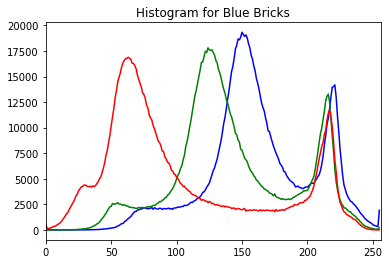

In [ ]:
# We must provide the default OpenCV images where BGR scale reigns.
# The 0 channel means blue.
img = blue_bricks
color = ('b', 'g', 'r')

for i, col in enumerate(color):
  histr = cv.calcHist(images=[img], channels=[i], mask=None, histSize=[256], ranges=[0, 256])
  plt.plot(histr, color=col)
  plt.xlim([0, 256])

plt.title('Histogram for Blue Bricks')

# Histogram - Part 2
In this part we will discuss:
* Histogram Equalization: a method of contrast adjustment on an image's histogram.

**No Histogram Equalization**

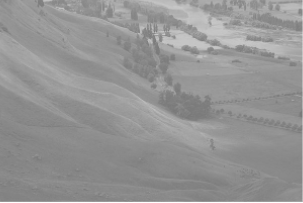

**Histogram Equalization Applied**

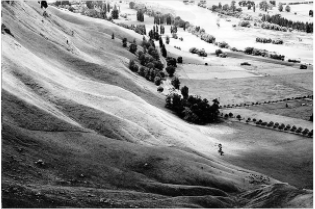

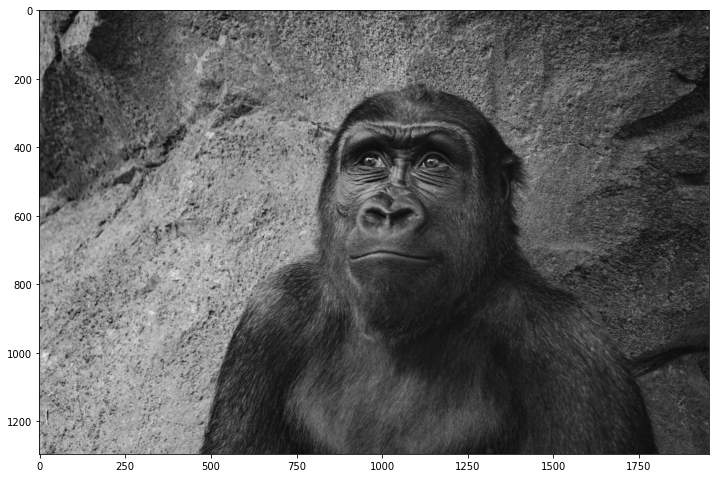

In [ ]:
gorilla = cv.imread('gorilla.jpg', 0)
display_img(gorilla)

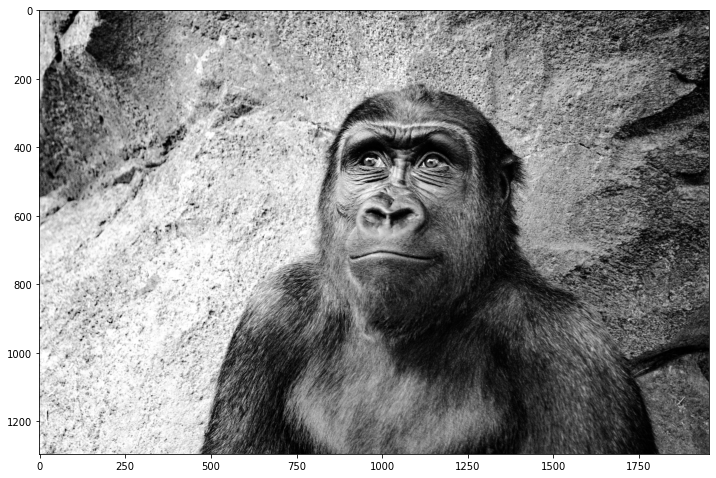

In [ ]:
eq_gorilla = cv.equalizeHist(gorilla)
display_img(eq_gorilla)

Text(0.5, 1.0, 'Histogram for an Equalized Image')

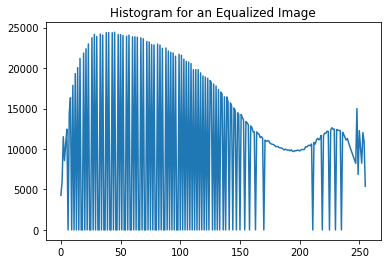

In [ ]:
# Now let's visualize the histogram of this equalized image we have.
hist_values = cv.calcHist([eq_gorilla], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(hist_values)
plt.title('Histogram for an Equalized Image')